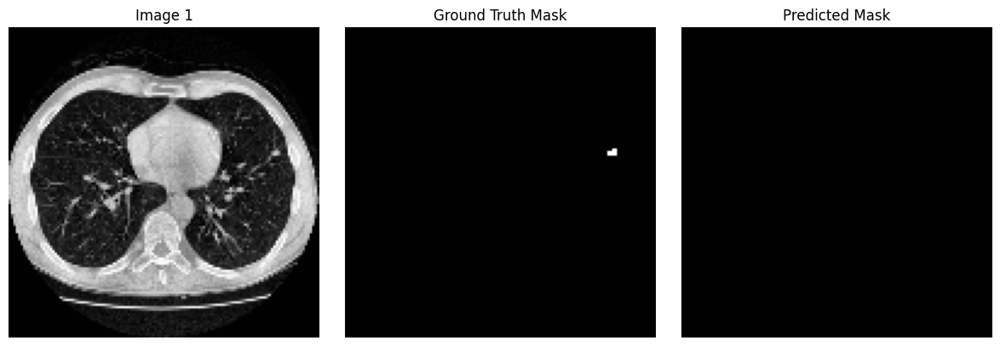

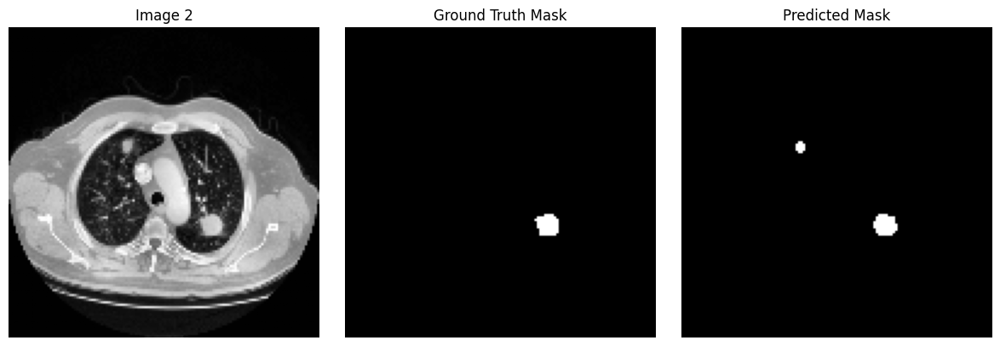

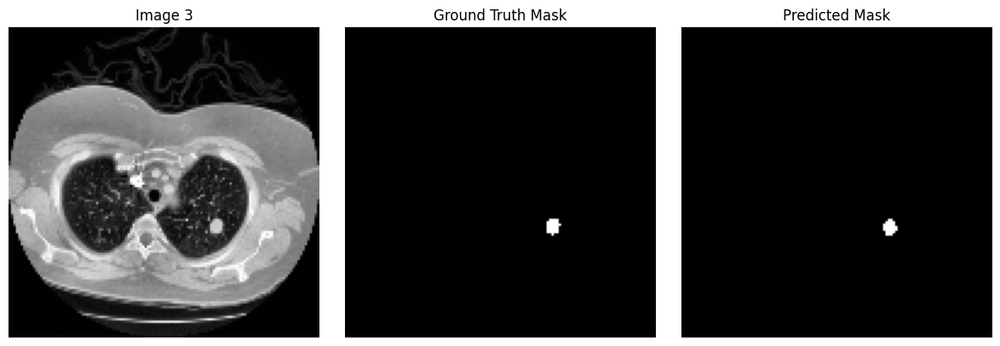

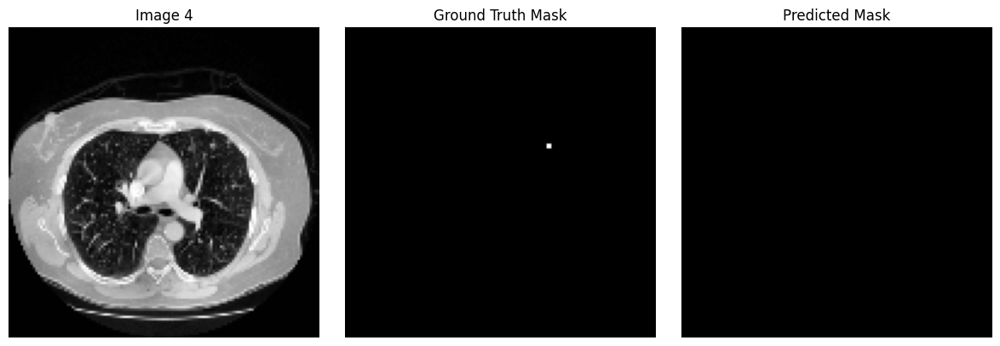

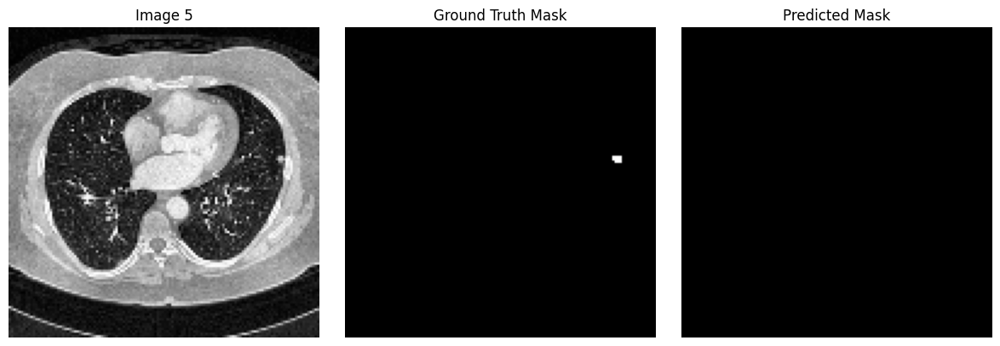

...

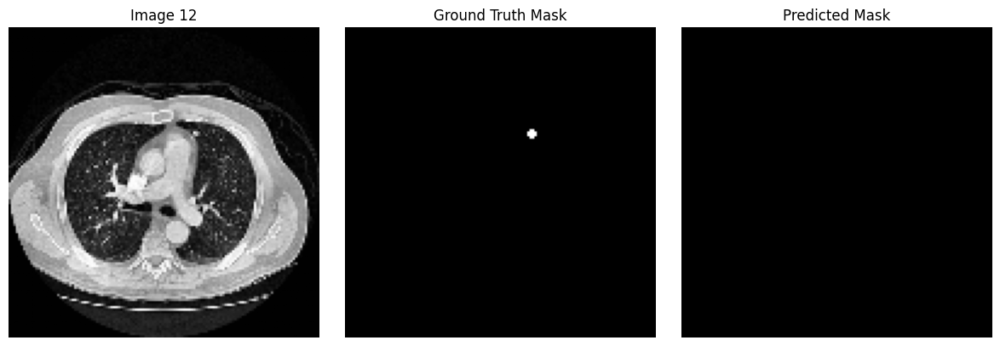

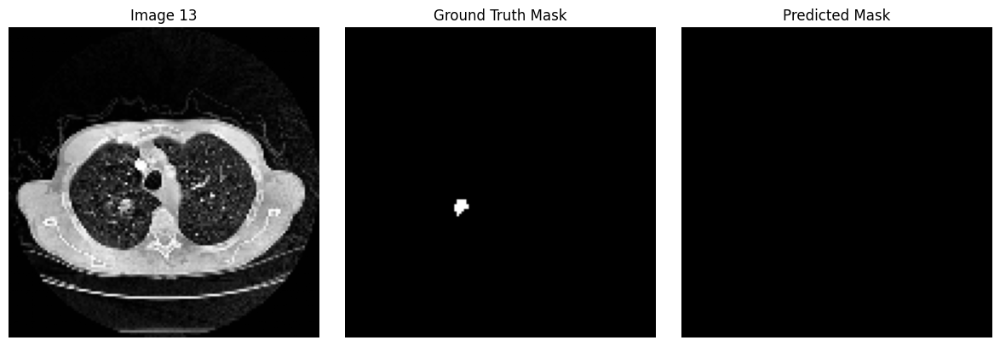

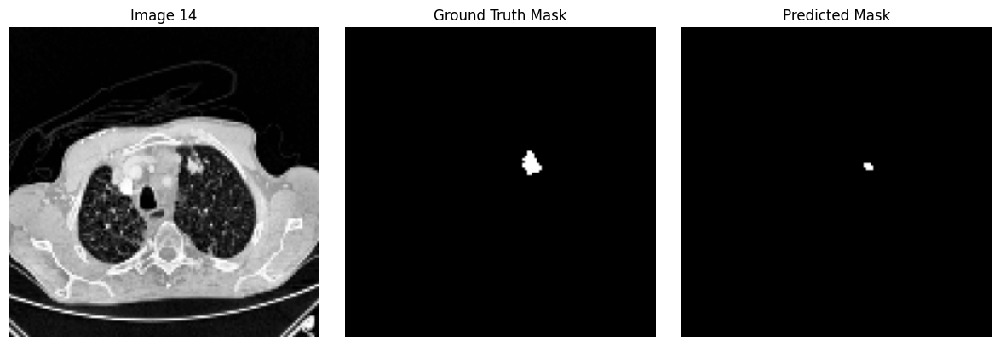

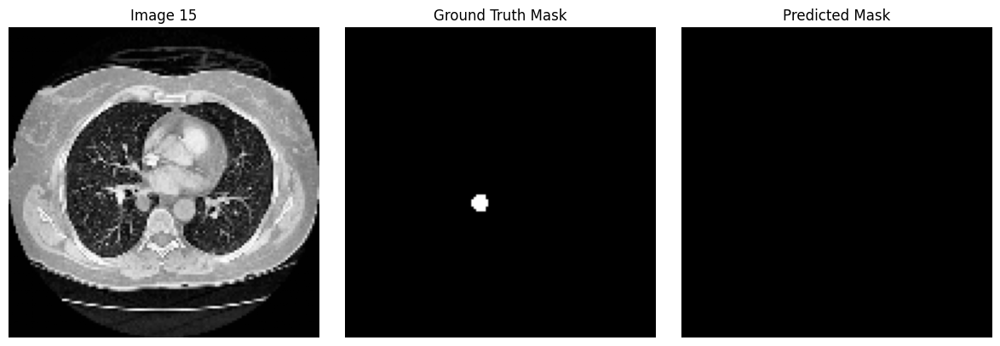

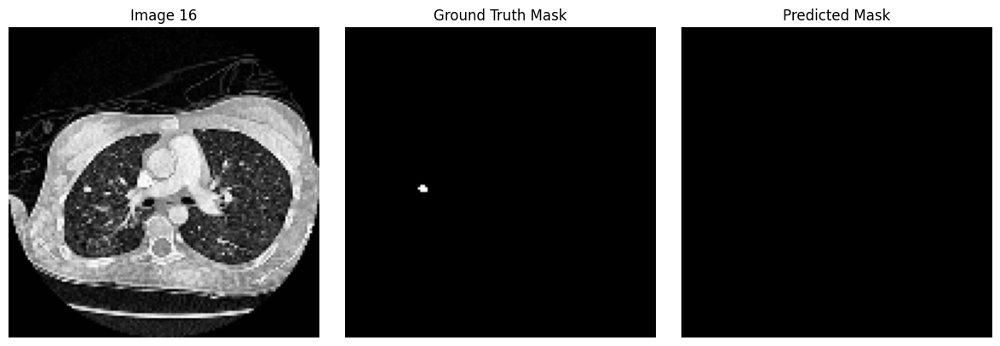

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Load the arrays (update paths to your files)
images = np.load('X_test1.npy')              # Lung CT image
masks = np.load('Y_test1.npy')                # Ground truth mask
predicted_masks = np.load('Y_pred1.npy') # Predicted mask

# Loop over each sample
for i in range(len(images)):
    image = images[i]
    mask = masks[i]
    predicted_mask = predicted_masks[i]

    # Convert image to grayscale if it's 3-channel
    if image.ndim == 3 and image.shape[-1] == 3:
        image_display = image[:, :, 0]
    else:
        image_display = image.squeeze()

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_display, cmap='gray')
    plt.title(f'Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [1]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def class_wise_iou_and_dice(y_true, y_pred, num_classes):
    iou_per_class = []
    dice_per_class = []
    
    for c in range(num_classes):
        y_true_c = (y_true == c).astype(np.uint8)
        y_pred_c = (y_pred == c).astype(np.uint8)
        
        intersection = np.logical_and(y_true_c, y_pred_c).sum()
        union = np.logical_or(y_true_c, y_pred_c).sum()
        iou = intersection / union if union != 0 else 1.0
        
        dice = (2 * intersection) / (y_true_c.sum() + y_pred_c.sum()) if (y_true_c.sum() + y_pred_c.sum()) != 0 else 1.0

        iou_per_class.append(iou)
        dice_per_class.append(dice)

    return iou_per_class, dice_per_class

# Load data
images = np.load('X_test1.npy')            # Optional
masks = np.load('Y_test1.npy')             # Shape: (N, 128, 128, 1)
predictions = np.load('Y_pred1.npy')       # Shape: (N, 128, 128, 1)

# Assuming classes are labeled from 0 to C-1
NUM_CLASSES = int(np.max([masks.max(), predictions.max()])) + 1

# Loop through each image and calculate metrics
for i in range(len(predictions)):
    y_true = masks[i].squeeze().astype(np.uint8)
    y_pred = predictions[i].squeeze().astype(np.uint8)

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    iou = iou_score(y_true, y_pred)
    dice = dice_score(y_true, y_pred)
    accuracy = accuracy_score(y_true_flat, y_pred_flat)
    precision = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)
    recall = recall_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)

    class_iou, class_dice = class_wise_iou_and_dice(y_true, y_pred, NUM_CLASSES)

    print(f"Image {i+1}:")
    print(f"  Overall IoU:        {iou:.4f}")
    print(f"  Overall Dice:       {dice:.4f}")
    print(f"  Accuracy:           {accuracy:.4f}")
    print(f"  Precision (macro):  {precision:.4f}")
    print(f"  Recall (macro):     {recall:.4f}")
    print("  Class-wise IoU:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_iou[c]:.4f}")
    print("  Class-wise Dice:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_dice[c]:.4f}")
    print("-" * 40)


Image 1:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9994
  Precision (macro):  0.9997
  Recall (macro):     0.5000
  Class-wise IoU:
    Class 0: 0.9994
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9997
    Class 1: 0.0000
----------------------------------------
Image 2:
  Overall IoU:        0.7204
  Overall Dice:       0.8375
  Accuracy:           0.9984
  Precision (macro):  0.8805
  Recall (macro):     0.9646
  Class-wise IoU:
    Class 0: 0.9984
    Class 1: 0.7204
  Class-wise Dice:
    Class 0: 0.9992
    Class 1: 0.8375
----------------------------------------
Image 3:
  Overall IoU:        0.7429
  Overall Dice:       0.8525
  Accuracy:           0.9995
  Precision (macro):  0.9332
  Recall (macro):     0.9192
  Class-wise IoU:
    Class 0: 0.9994
    Class 1: 0.7429
  Class-wise Dice:
    Class 0: 0.9997
    Class 1: 0.8525
----------------------------------------
Image 4:
  Overall IoU:        0.0000
  Overall Dice:       0.00

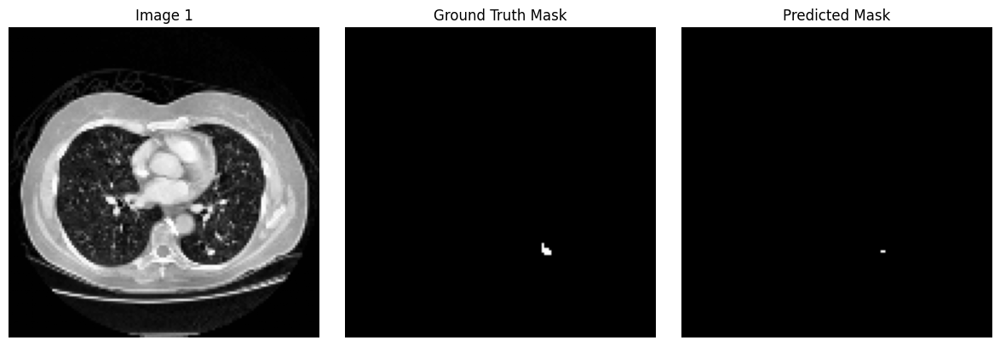

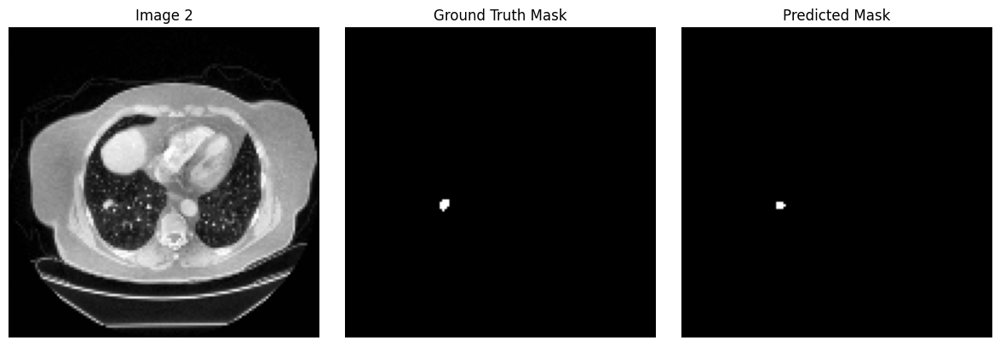

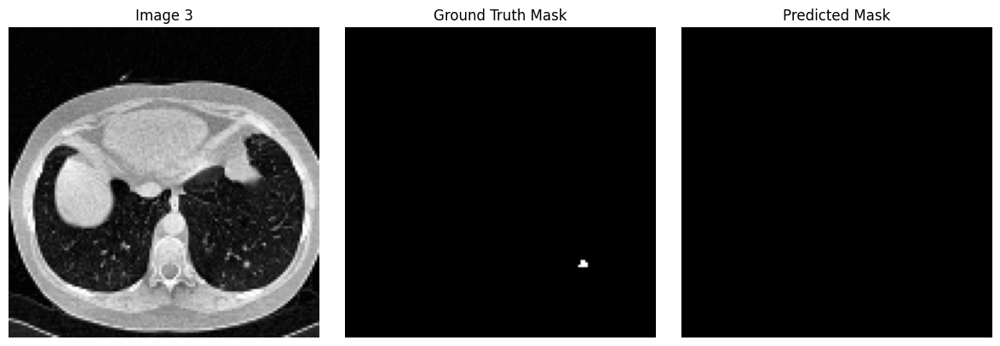

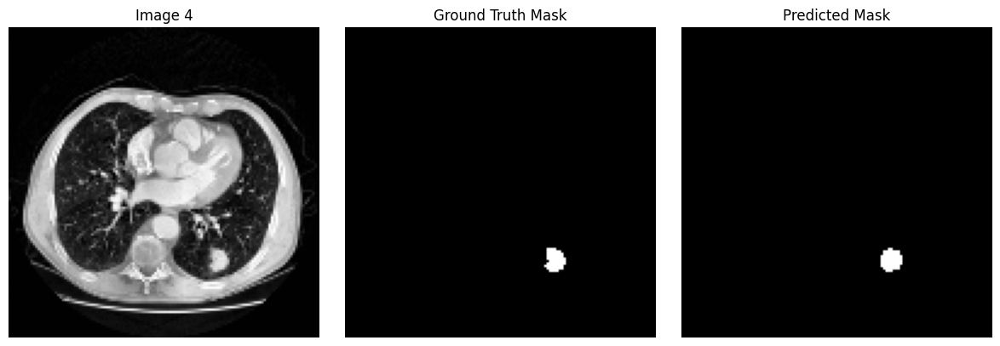

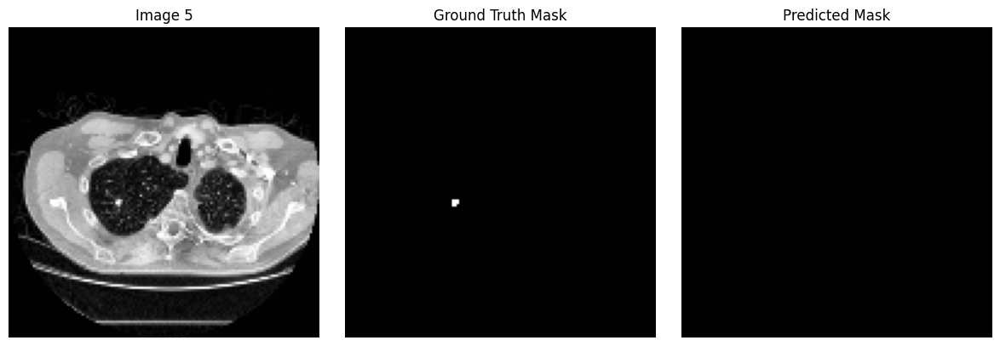

...

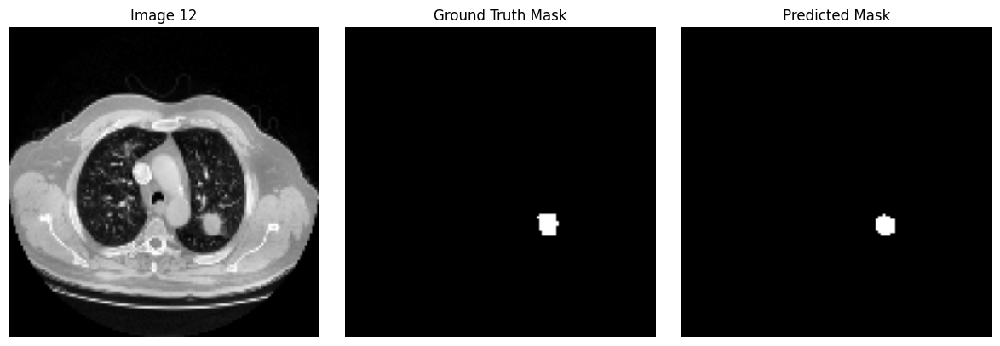

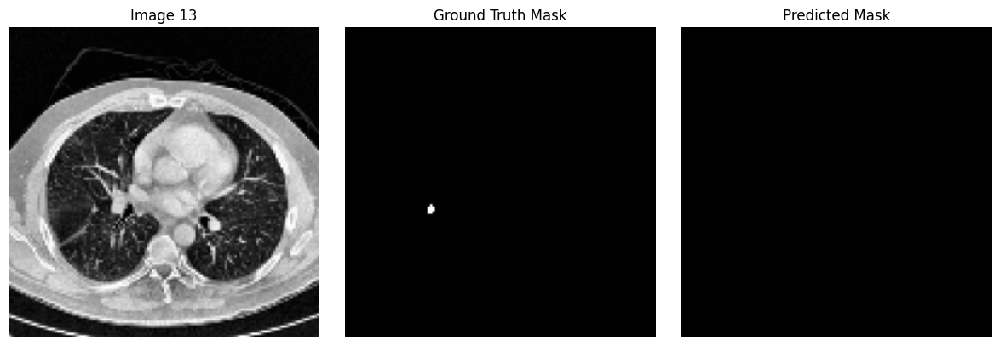

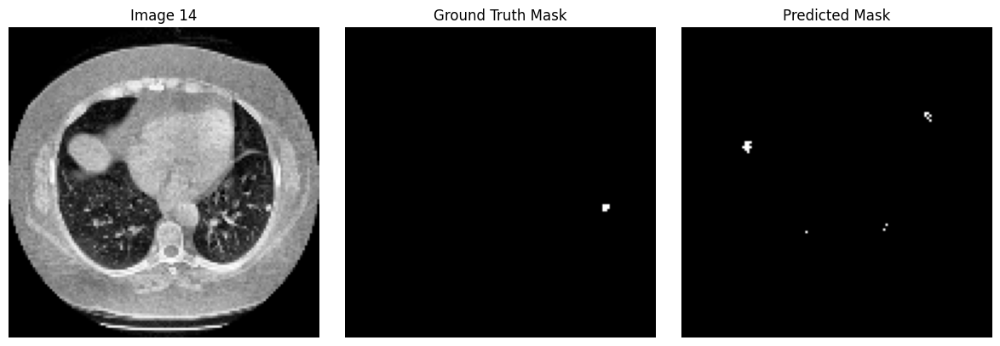

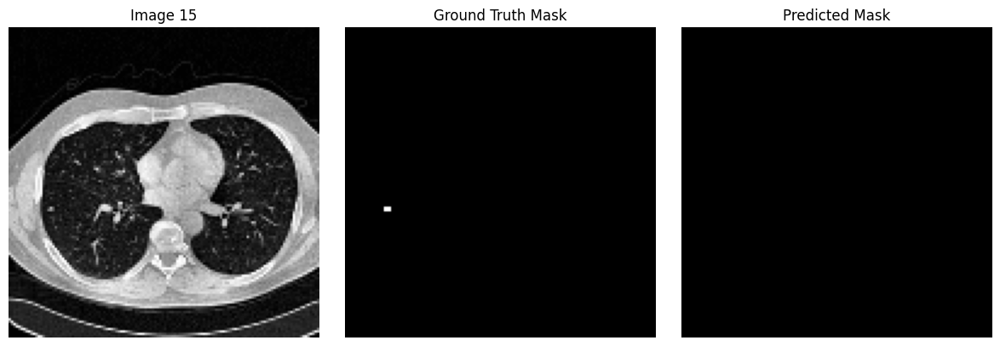

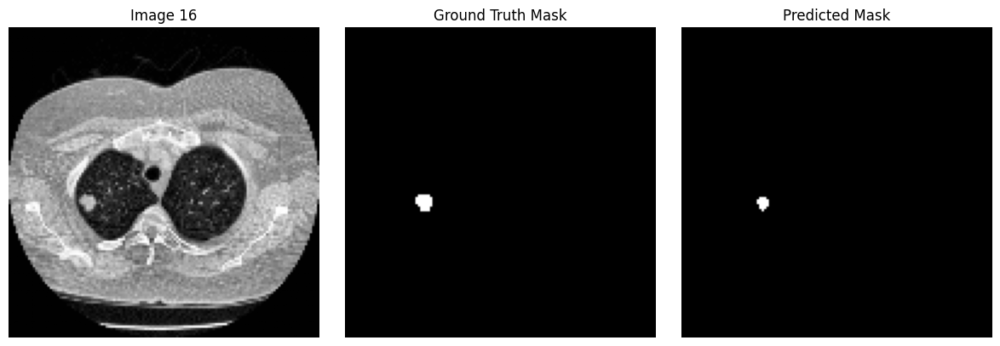

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Load the arrays (update paths to your files)
images = np.load('X_test2.npy')              # Lung CT image
masks = np.load('Y_test2.npy')                # Ground truth mask
predicted_masks = np.load('Y_pred2.npy') # Predicted mask

# Loop over each sample
for i in range(len(images)):
    image = images[i]
    mask = masks[i]
    predicted_mask = predicted_masks[i]

    # Convert image to grayscale if it's 3-channel
    if image.ndim == 3 and image.shape[-1] == 3:
        image_display = image[:, :, 0]
    else:
        image_display = image.squeeze()

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_display, cmap='gray')
    plt.title(f'Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [2]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def class_wise_iou_and_dice(y_true, y_pred, num_classes):
    iou_per_class = []
    dice_per_class = []
    
    for c in range(num_classes):
        y_true_c = (y_true == c).astype(np.uint8)
        y_pred_c = (y_pred == c).astype(np.uint8)
        
        intersection = np.logical_and(y_true_c, y_pred_c).sum()
        union = np.logical_or(y_true_c, y_pred_c).sum()
        iou = intersection / union if union != 0 else 1.0
        
        dice = (2 * intersection) / (y_true_c.sum() + y_pred_c.sum()) if (y_true_c.sum() + y_pred_c.sum()) != 0 else 1.0

        iou_per_class.append(iou)
        dice_per_class.append(dice)

    return iou_per_class, dice_per_class

# Load data
images = np.load('X_test2.npy')            # Optional
masks = np.load('Y_test2.npy')             # Shape: (N, 128, 128, 1)
predictions = np.load('Y_pred2.npy')       # Shape: (N, 128, 128, 1)

# Assuming classes are labeled from 0 to C-1
NUM_CLASSES = int(np.max([masks.max(), predictions.max()])) + 1

# Loop through each image and calculate metrics
for i in range(len(predictions)):
    y_true = masks[i].squeeze().astype(np.uint8)
    y_pred = predictions[i].squeeze().astype(np.uint8)

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    iou = iou_score(y_true, y_pred)
    dice = dice_score(y_true, y_pred)
    accuracy = accuracy_score(y_true_flat, y_pred_flat)
    precision = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)
    recall = recall_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)

    class_iou, class_dice = class_wise_iou_and_dice(y_true, y_pred, NUM_CLASSES)

    print(f"Image {i+1}:")
    print(f"  Overall IoU:        {iou:.4f}")
    print(f"  Overall Dice:       {dice:.4f}")
    print(f"  Accuracy:           {accuracy:.4f}")
    print(f"  Precision (macro):  {precision:.4f}")
    print(f"  Recall (macro):     {recall:.4f}")
    print("  Class-wise IoU:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_iou[c]:.4f}")
    print("  Class-wise Dice:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_dice[c]:.4f}")
    print("-" * 40)


Image 1:
  Overall IoU:        0.1667
  Overall Dice:       0.2857
  Accuracy:           0.9994
  Precision (macro):  0.9997
  Recall (macro):     0.5833
  Class-wise IoU:
    Class 0: 0.9994
    Class 1: 0.1667
  Class-wise Dice:
    Class 0: 0.9997
    Class 1: 0.2857
----------------------------------------
Image 2:
  Overall IoU:        0.6667
  Overall Dice:       0.8000
  Accuracy:           0.9997
  Precision (macro):  0.9998
  Recall (macro):     0.8333
  Class-wise IoU:
    Class 0: 0.9997
    Class 1: 0.6667
  Class-wise Dice:
    Class 0: 0.9998
    Class 1: 0.8000
----------------------------------------
Image 3:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9995
  Precision (macro):  0.9997
  Recall (macro):     0.5000
  Class-wise IoU:
    Class 0: 0.9995
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9997
    Class 1: 0.0000
----------------------------------------
Image 4:
  Overall IoU:        0.8630
  Overall Dice:       0.92

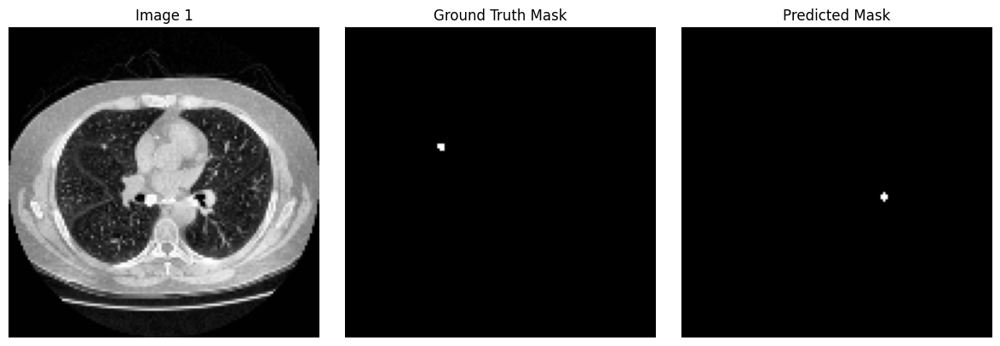

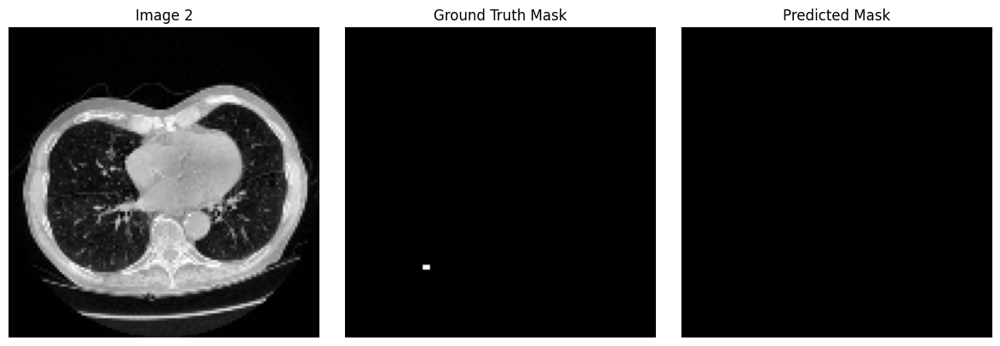

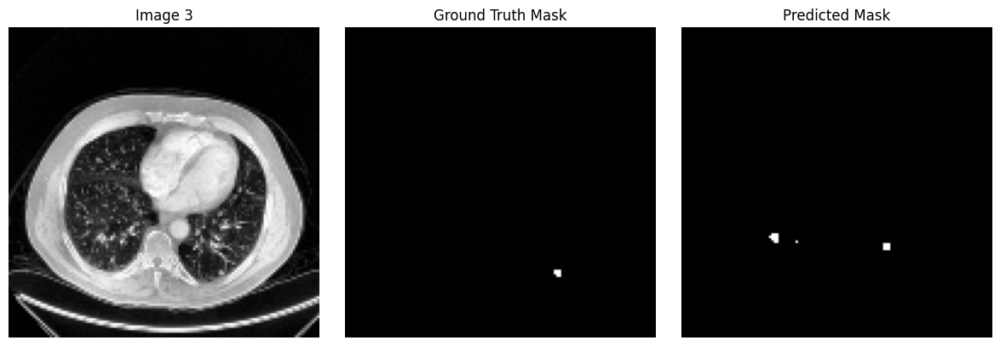

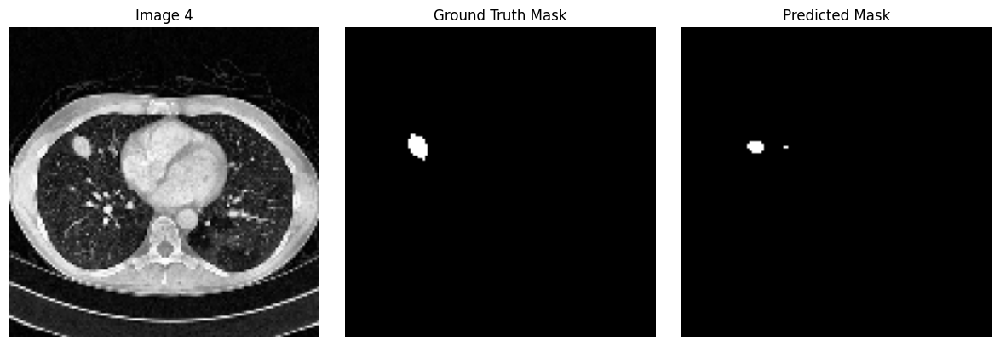

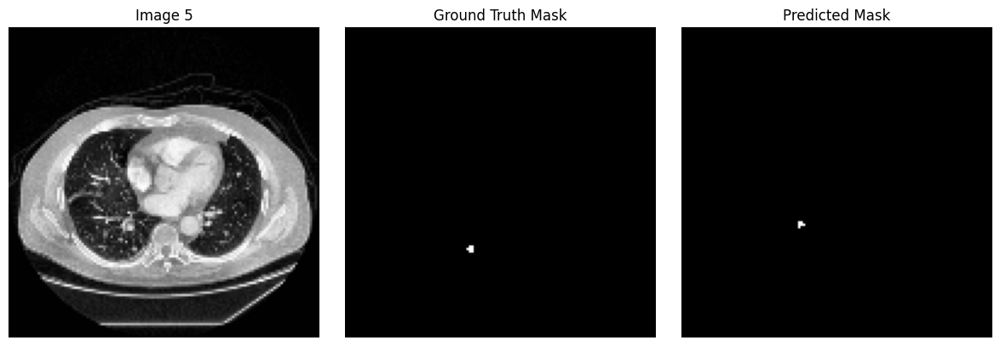

...

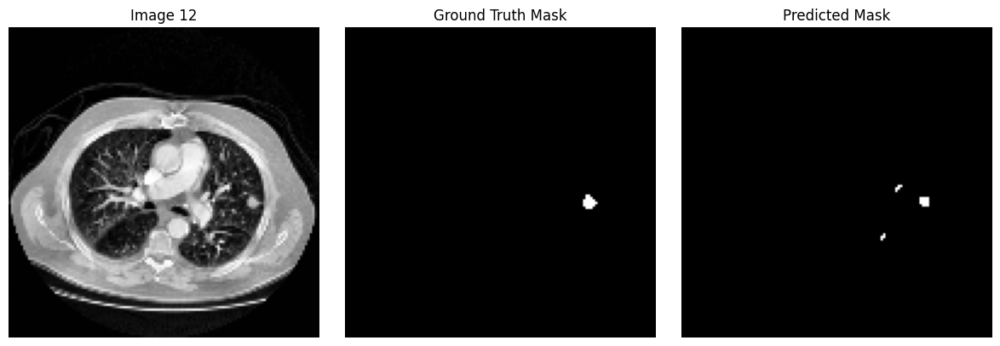

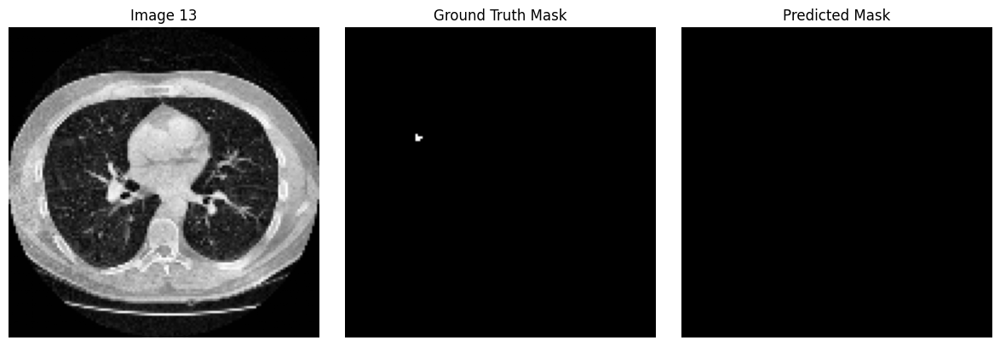

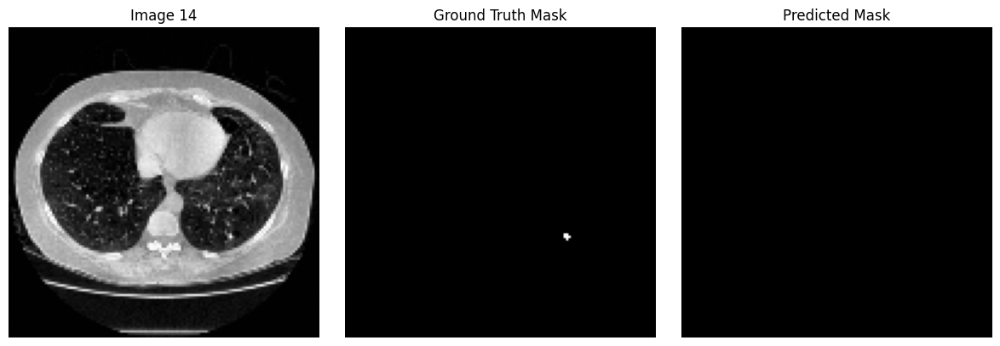

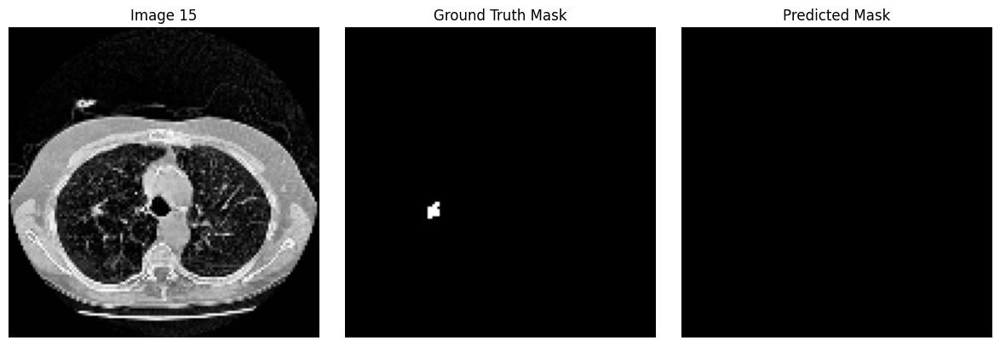

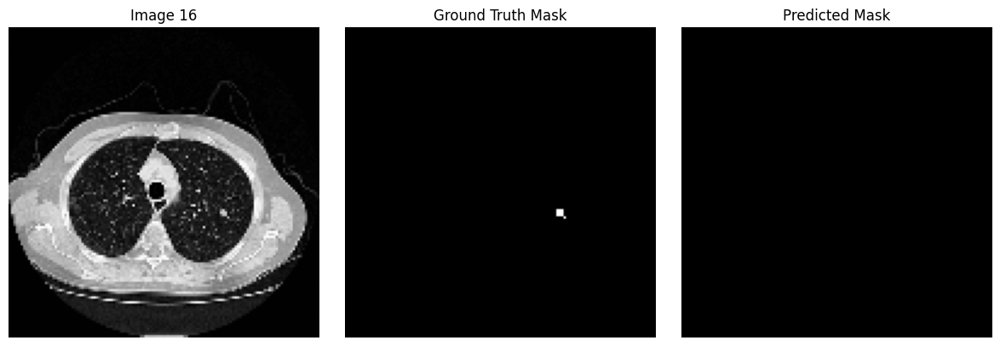

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Load the arrays (update paths to your files)
images = np.load('X_test3.npy')              # Lung CT image
masks = np.load('Y_test3.npy')                # Ground truth mask
predicted_masks = np.load('Y_pred3.npy') # Predicted mask

# Loop over each sample
for i in range(len(images)):
    image = images[i]
    mask = masks[i]
    predicted_mask = predicted_masks[i]

    # Convert image to grayscale if it's 3-channel
    if image.ndim == 3 and image.shape[-1] == 3:
        image_display = image[:, :, 0]
    else:
        image_display = image.squeeze()

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_display, cmap='gray')
    plt.title(f'Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [3]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def class_wise_iou_and_dice(y_true, y_pred, num_classes):
    iou_per_class = []
    dice_per_class = []
    
    for c in range(num_classes):
        y_true_c = (y_true == c).astype(np.uint8)
        y_pred_c = (y_pred == c).astype(np.uint8)
        
        intersection = np.logical_and(y_true_c, y_pred_c).sum()
        union = np.logical_or(y_true_c, y_pred_c).sum()
        iou = intersection / union if union != 0 else 1.0
        
        dice = (2 * intersection) / (y_true_c.sum() + y_pred_c.sum()) if (y_true_c.sum() + y_pred_c.sum()) != 0 else 1.0

        iou_per_class.append(iou)
        dice_per_class.append(dice)

    return iou_per_class, dice_per_class

# Load data
images = np.load('X_test3.npy')            # Optional
masks = np.load('Y_test3.npy')             # Shape: (N, 128, 128, 1)
predictions = np.load('Y_pred3.npy')       # Shape: (N, 128, 128, 1)

# Assuming classes are labeled from 0 to C-1
NUM_CLASSES = int(np.max([masks.max(), predictions.max()])) + 1

# Loop through each image and calculate metrics
for i in range(len(predictions)):
    y_true = masks[i].squeeze().astype(np.uint8)
    y_pred = predictions[i].squeeze().astype(np.uint8)

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    iou = iou_score(y_true, y_pred)
    dice = dice_score(y_true, y_pred)
    accuracy = accuracy_score(y_true_flat, y_pred_flat)
    precision = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)
    recall = recall_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)

    class_iou, class_dice = class_wise_iou_and_dice(y_true, y_pred, NUM_CLASSES)

    print(f"Image {i+1}:")
    print(f"  Overall IoU:        {iou:.4f}")
    print(f"  Overall Dice:       {dice:.4f}")
    print(f"  Accuracy:           {accuracy:.4f}")
    print(f"  Precision (macro):  {precision:.4f}")
    print(f"  Recall (macro):     {recall:.4f}")
    print("  Class-wise IoU:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_iou[c]:.4f}")
    print("  Class-wise Dice:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_dice[c]:.4f}")
    print("-" * 40)


Image 1:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9990
  Precision (macro):  0.4998
  Recall (macro):     0.4998
  Class-wise IoU:
    Class 0: 0.9990
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9995
    Class 1: 0.0000
----------------------------------------
Image 2:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9996
  Precision (macro):  0.9998
  Recall (macro):     0.5000
  Class-wise IoU:
    Class 0: 0.9996
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9998
    Class 1: 0.0000
----------------------------------------
Image 3:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9982
  Precision (macro):  0.4998
  Recall (macro):     0.4993
  Class-wise IoU:
    Class 0: 0.9982
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9991
    Class 1: 0.0000
----------------------------------------
Image 4:
  Overall IoU:        0.4603
  Overall Dice:       0.63

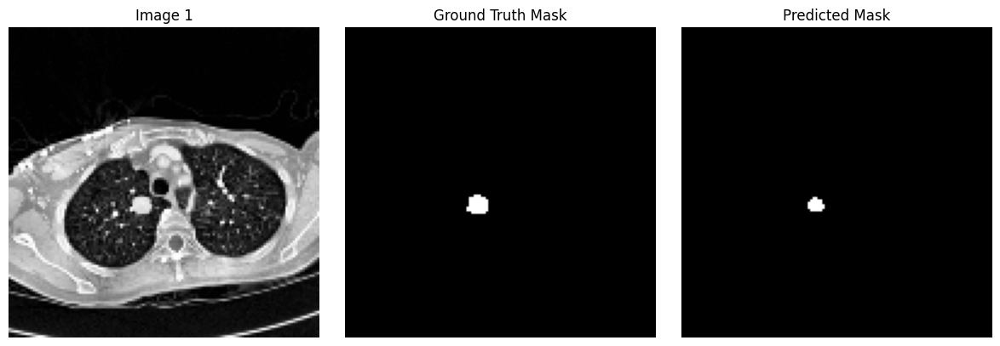

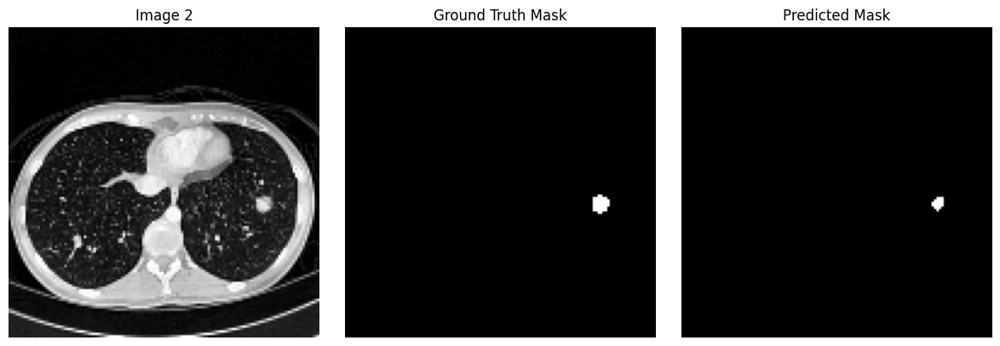

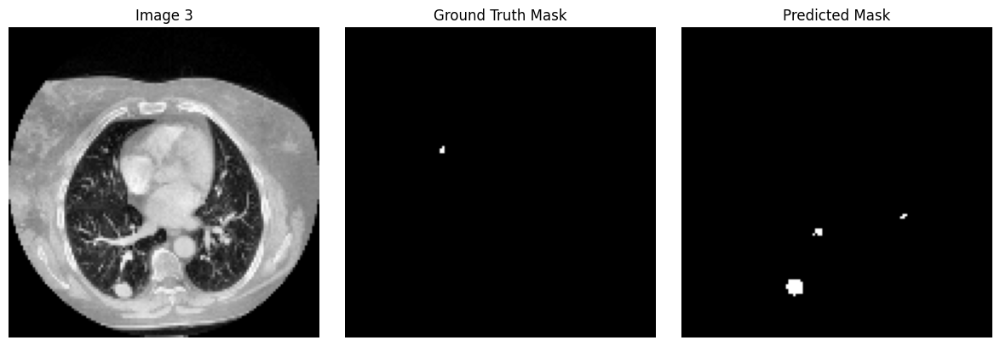

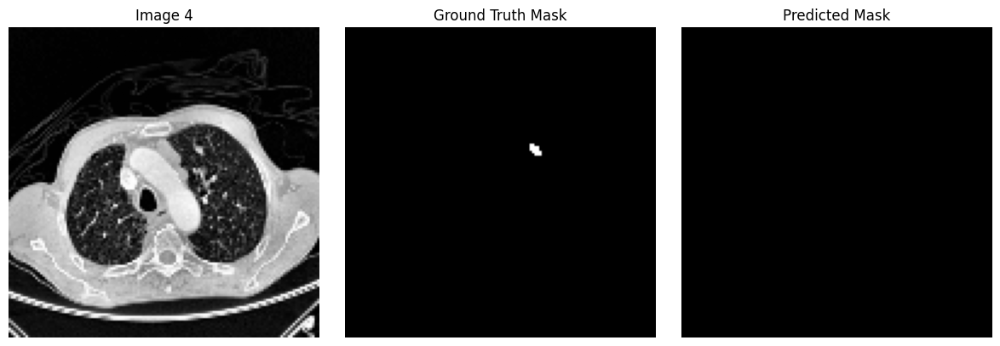

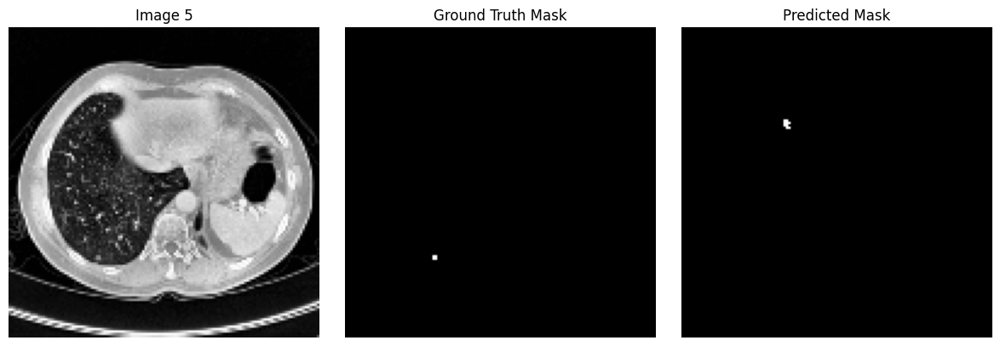

...

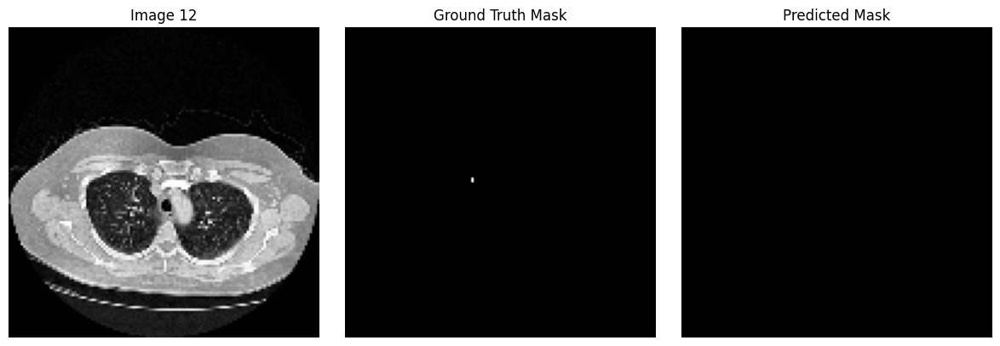

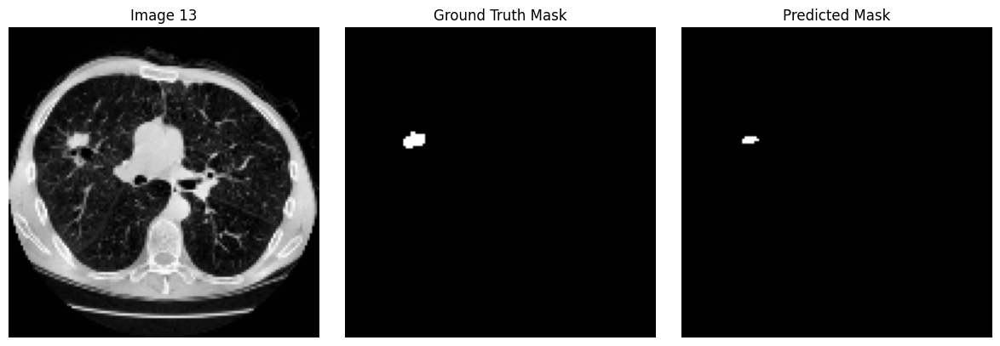

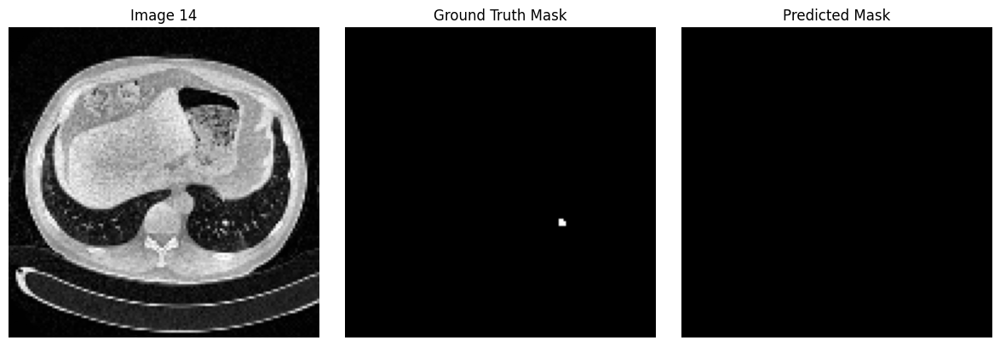

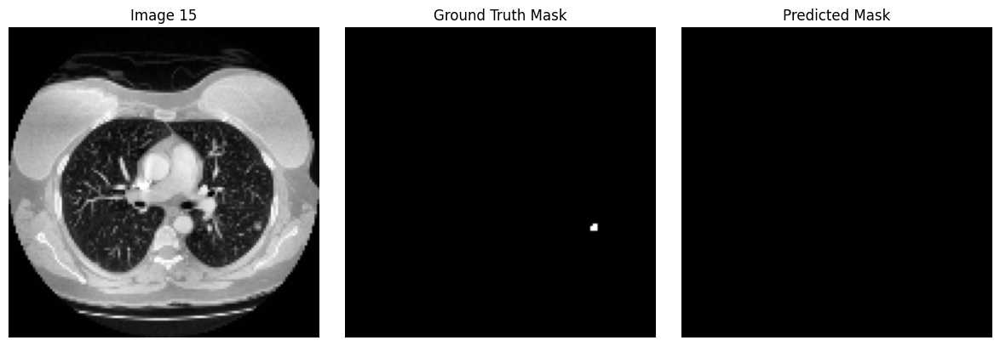

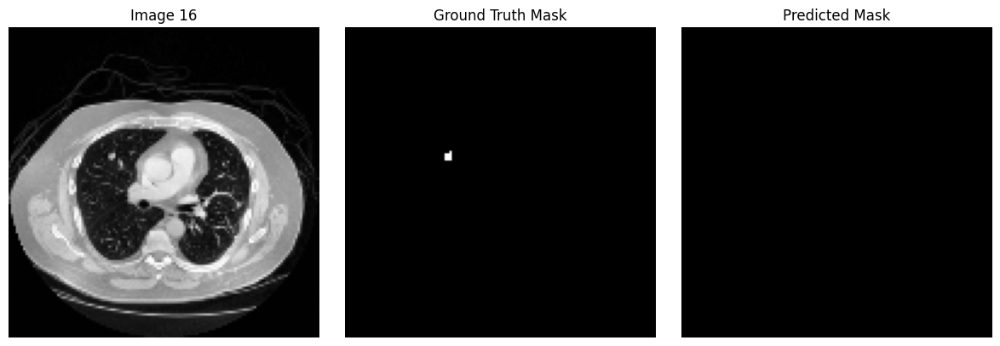

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Load the arrays (update paths to your files)
images = np.load('X_test4.npy')              # Lung CT image
masks = np.load('Y_test4.npy')                # Ground truth mask
predicted_masks = np.load('Y_pred4.npy') # Predicted mask

# Loop over each sample
for i in range(len(images)):
    image = images[i]
    mask = masks[i]
    predicted_mask = predicted_masks[i]

    # Convert image to grayscale if it's 3-channel
    if image.ndim == 3 and image.shape[-1] == 3:
        image_display = image[:, :, 0]
    else:
        image_display = image.squeeze()

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_display, cmap='gray')
    plt.title(f'Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [4]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def class_wise_iou_and_dice(y_true, y_pred, num_classes):
    iou_per_class = []
    dice_per_class = []
    
    for c in range(num_classes):
        y_true_c = (y_true == c).astype(np.uint8)
        y_pred_c = (y_pred == c).astype(np.uint8)
        
        intersection = np.logical_and(y_true_c, y_pred_c).sum()
        union = np.logical_or(y_true_c, y_pred_c).sum()
        iou = intersection / union if union != 0 else 1.0
        
        dice = (2 * intersection) / (y_true_c.sum() + y_pred_c.sum()) if (y_true_c.sum() + y_pred_c.sum()) != 0 else 1.0

        iou_per_class.append(iou)
        dice_per_class.append(dice)

    return iou_per_class, dice_per_class

# load data
images = np.load('X_test4.npy')            # Optional
masks = np.load('Y_test4.npy')             # Shape: (N, 128, 128, 1)
predictions = np.load('Y_pred4.npy')       # Shape: (N, 128, 128, 1)

# Assuming classes are labeled from 0 to C-1
NUM_CLASSES = int(np.max([masks.max(), predictions.max()])) + 1

# Loop through each image and calculate metrics
for i in range(len(predictions)):
    y_true = masks[i].squeeze().astype(np.uint8)
    y_pred = predictions[i].squeeze().astype(np.uint8)

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    iou = iou_score(y_true, y_pred)
    dice = dice_score(y_true, y_pred)
    accuracy = accuracy_score(y_true_flat, y_pred_flat)
    precision = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)
    recall = recall_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)

    class_iou, class_dice = class_wise_iou_and_dice(y_true, y_pred, NUM_CLASSES)

    print(f"Image {i+1}:")
    print(f"  Overall IoU:        {iou:.4f}")
    print(f"  Overall Dice:       {dice:.4f}")
    print(f"  Accuracy:           {accuracy:.4f}")
    print(f"  Precision (macro):  {precision:.4f}")
    print(f"  Recall (macro):     {recall:.4f}")
    print("  Class-wise IoU:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_iou[c]:.4f}")
    print("  Class-wise Dice:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_dice[c]:.4f}")
    print("-" * 40)


Image 1:
  Overall IoU:        0.5517
  Overall Dice:       0.7111
  Accuracy:           0.9984
  Precision (macro):  0.9992
  Recall (macro):     0.7759
  Class-wise IoU:
    Class 0: 0.9984
    Class 1: 0.5517
  Class-wise Dice:
    Class 0: 0.9992
    Class 1: 0.7111
----------------------------------------
Image 2:
  Overall IoU:        0.4884
  Overall Dice:       0.6562
  Accuracy:           0.9987
  Precision (macro):  0.9993
  Recall (macro):     0.7442
  Class-wise IoU:
    Class 0: 0.9987
    Class 1: 0.4884
  Class-wise Dice:
    Class 0: 0.9993
    Class 1: 0.6562
----------------------------------------
Image 3:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9966
  Precision (macro):  0.4998
  Recall (macro):     0.4984
  Class-wise IoU:
    Class 0: 0.9966
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9983
    Class 1: 0.0000
----------------------------------------
Image 4:
  Overall IoU:        0.0000
  Overall Dice:       0.00

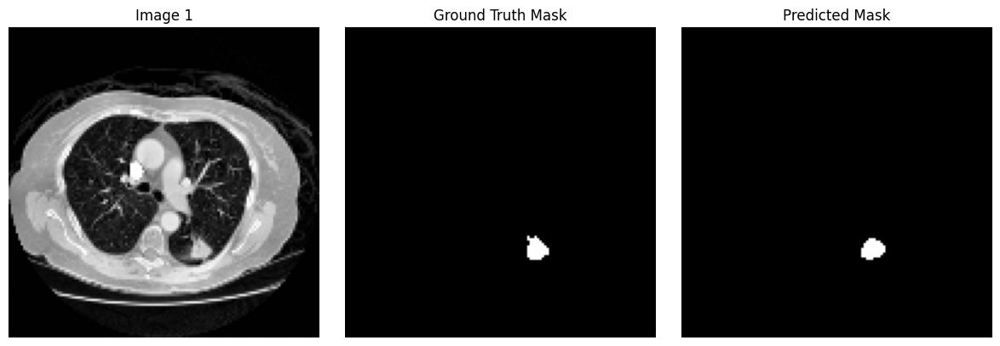

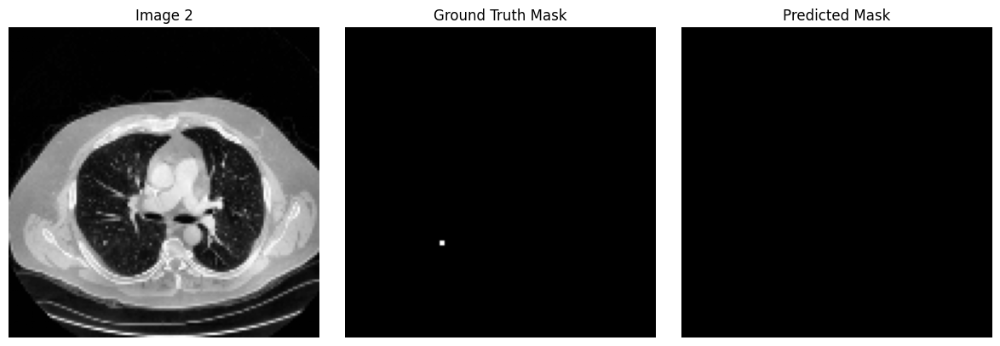

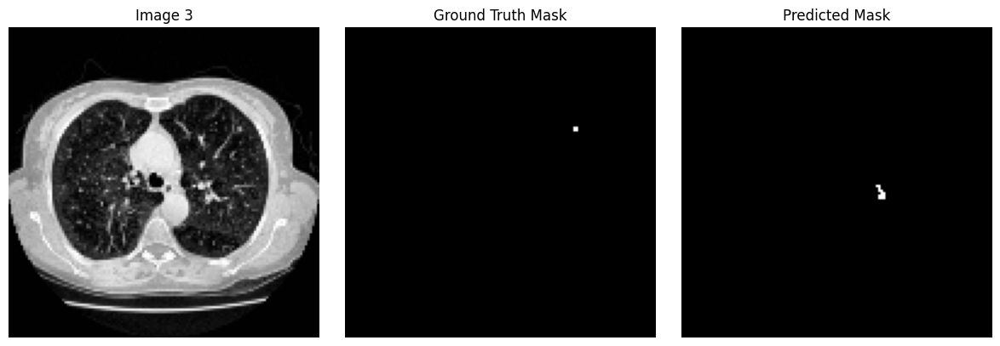

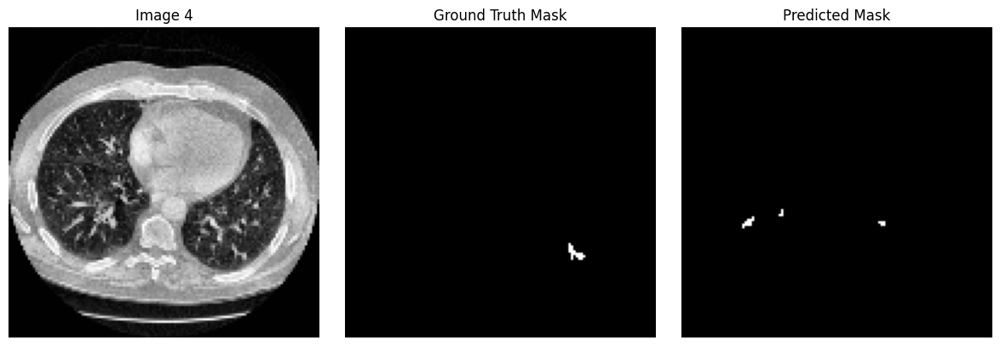

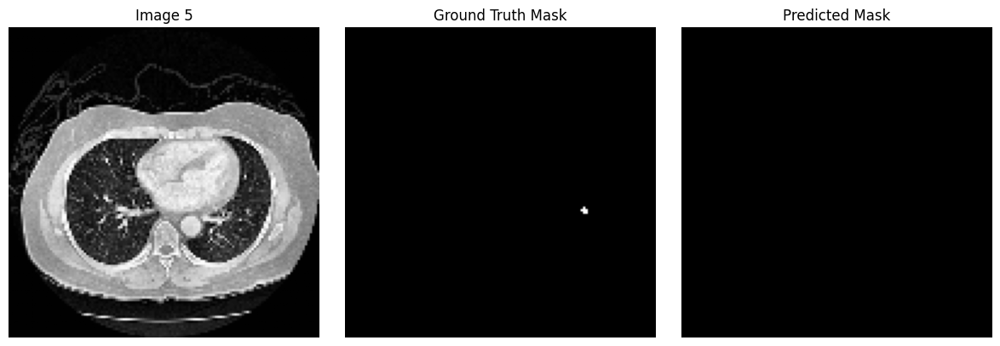

...

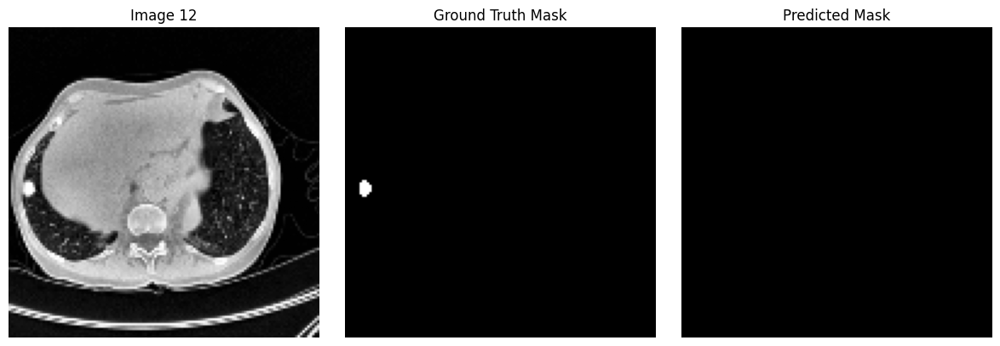

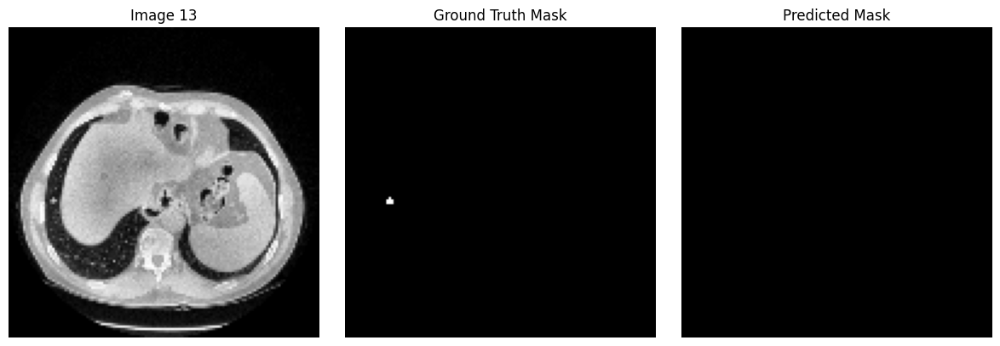

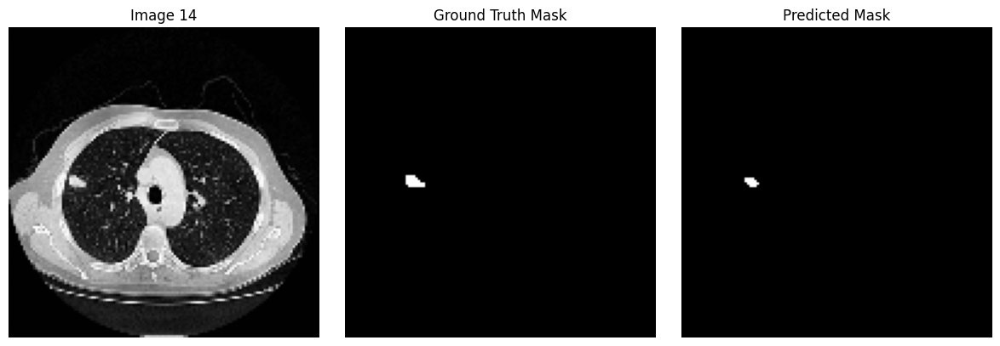

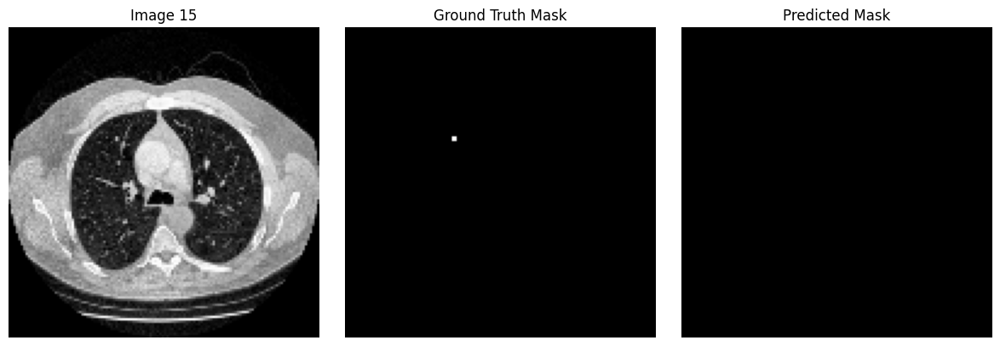

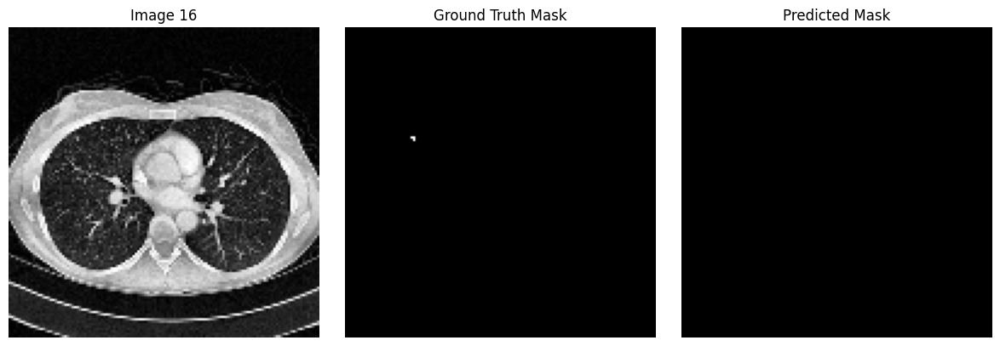

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Load the arrays (update paths to your files)
images = np.load('X_test5.npy')              # Lung CT image
masks = np.load('Y_test5.npy')                # Ground truth mask
predicted_masks = np.load('Y_pred5.npy') # Predicted mask

# Loop over each sample
for i in range(len(images)):
    image = images[i]
    mask = masks[i]
    predicted_mask = predicted_masks[i]

    # Convert image to grayscale if it's 3-channel
    if image.ndim == 3 and image.shape[-1] == 3:
        image_display = image[:, :, 0]
    else:
        image_display = image.squeeze()

    # Plotting
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_display, cmap='gray')
    plt.title(f'Image {i+1}')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mask.squeeze(), cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask.squeeze(), cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [5]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def iou_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    return intersection / union if union != 0 else 1.0

def dice_score(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    return (2. * intersection) / (y_true.sum() + y_pred.sum()) if (y_true.sum() + y_pred.sum()) != 0 else 1.0

def class_wise_iou_and_dice(y_true, y_pred, num_classes):
    iou_per_class = []
    dice_per_class = []
    
    for c in range(num_classes):
        y_true_c = (y_true == c).astype(np.uint8)
        y_pred_c = (y_pred == c).astype(np.uint8)
        
        intersection = np.logical_and(y_true_c, y_pred_c).sum()
        union = np.logical_or(y_true_c, y_pred_c).sum()
        iou = intersection / union if union != 0 else 1.0
        
        dice = (2 * intersection) / (y_true_c.sum() + y_pred_c.sum()) if (y_true_c.sum() + y_pred_c.sum()) != 0 else 1.0

        iou_per_class.append(iou)
        dice_per_class.append(dice)

    return iou_per_class, dice_per_class

# Load data
images = np.load('X_test5.npy')            # Optional
masks = np.load('Y_test5.npy')             # Shape: (N, 128, 128, 1)
predictions = np.load('Y_pred5.npy')       # Shape: (N, 128, 128, 1)

# Assuming classes are labeled from 0 to C-1
NUM_CLASSES = int(np.max([masks.max(), predictions.max()])) + 1

# Loop through each image and calculate metrics
for i in range(len(predictions)):
    y_true = masks[i].squeeze().astype(np.uint8)
    y_pred = predictions[i].squeeze().astype(np.uint8)

    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    iou = iou_score(y_true, y_pred)
    dice = dice_score(y_true, y_pred)
    accuracy = accuracy_score(y_true_flat, y_pred_flat)
    precision = precision_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)
    recall = recall_score(y_true_flat, y_pred_flat, average='macro', zero_division=1)

    class_iou, class_dice = class_wise_iou_and_dice(y_true, y_pred, NUM_CLASSES)

    print(f"Image {i+1}:")
    print(f"  Overall IoU:        {iou:.4f}")
    print(f"  Overall Dice:       {dice:.4f}")
    print(f"  Accuracy:           {accuracy:.4f}")
    print(f"  Precision (macro):  {precision:.4f}")
    print(f"  Recall (macro):     {recall:.4f}")
    print("  Class-wise IoU:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_iou[c]:.4f}")
    print("  Class-wise Dice:")
    for c in range(NUM_CLASSES):
        print(f"    Class {c}: {class_dice[c]:.4f}")
    print("-" * 40)


Image 1:
  Overall IoU:        0.7945
  Overall Dice:       0.8855
  Accuracy:           0.9991
  Precision (macro):  0.9392
  Recall (macro):     0.9459
  Class-wise IoU:
    Class 0: 0.9991
    Class 1: 0.7945
  Class-wise Dice:
    Class 0: 0.9995
    Class 1: 0.8855
----------------------------------------
Image 2:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9998
  Precision (macro):  0.9999
  Recall (macro):     0.5000
  Class-wise IoU:
    Class 0: 0.9998
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9999
    Class 1: 0.0000
----------------------------------------
Image 3:
  Overall IoU:        0.0000
  Overall Dice:       0.0000
  Accuracy:           0.9990
  Precision (macro):  0.4999
  Recall (macro):     0.4996
  Class-wise IoU:
    Class 0: 0.9990
    Class 1: 0.0000
  Class-wise Dice:
    Class 0: 0.9995
    Class 1: 0.0000
----------------------------------------
Image 4:
  Overall IoU:        0.0000
  Overall Dice:       0.00